In [175]:
import re
import pandas as pd
import numpy as np
import dtale
from tqdm import tqdm

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.manifold import TSNE
from wordcloud import WordCloud, STOPWORDS

import distance
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
from fuzzywuzzy import fuzz


In [49]:
data = pd.read_csv('../../datafiles/CS1_quora/train.csv')

In [50]:
data.info(),data.shape

&lt;class &#39;pandas.core.frame.DataFrame&#39;&gt;
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404290 non-null  int64 
 1   qid1          404290 non-null  int64 
 2   qid2          404290 non-null  int64 
 3   question1     404289 non-null  object
 4   question2     404288 non-null  object
 5   is_duplicate  404290 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


(None, (404290, 6))

In [51]:
data.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


&lt;AxesSubplot:&gt;

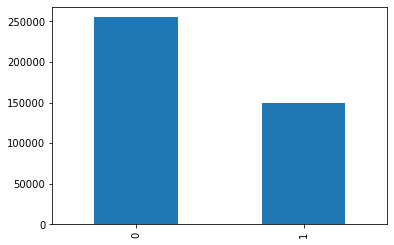

In [52]:
data['is_duplicate'].value_counts().plot.bar()

In [53]:
data['is_duplicate'].value_counts(),data['is_duplicate'].value_counts(normalize=True)

(0    255027
 1    149263
 Name: is_duplicate, dtype: int64,
 0    0.630802
 1    0.369198
 Name: is_duplicate, dtype: float64)

In [54]:
d= dtale.show(data)
# print(d._main_url)

http://LAPTOP-M9DIN7JD:40000/dtale/main/1
It looks like this data may have already been loaded to D-Tale based on shape and column names. Here is URL of the data that seems to match it:

None

If you still want to load this data please use the following command:

dtale.show(df, ignore_duplicate=True)


In [55]:
dtale.show(data)

http://LAPTOP-M9DIN7JD:40000/dtale/main/1
It looks like this data may have already been loaded to D-Tale based on shape and column names. Here is URL of the data that seems to match it:

None

If you still want to load this data please use the following command:

dtale.show(df, ignore_duplicate=True)


In [56]:
lst1 = list(data['qid1'])
lst2 = list(data['qid2'])
lst1.extend(lst2)
qidlst = pd.Series(lst1)

Those are the total no. of unique questions asked

In [57]:
qidlst.nunique()

537933

In [58]:
qidlst.value_counts()

2559      157
30782     120
4044      111
2561       88
14376      79
         ... 
75109       1
81254       1
85352       1
83305       1
168274      1
Length: 537933, dtype: int64

No of questions appeared more than once, appeared only once

In [59]:
sum(qidlst.value_counts()>1),sum(qidlst.value_counts()==1)

(111780, 426153)

Checking duplicate rows

In [60]:
data[data[['qid1','qid2']].duplicated()]

,id,qid1,qid2,question1,question2,is_duplicate


There are no duplicate rows

> Plotting frequency of questions

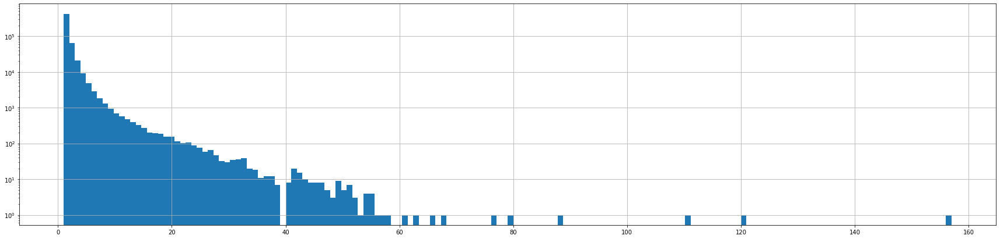

In [61]:
qidlst.value_counts().hist(bins=160)
ax = plt.gca()
fig = plt.gcf()
fig.set_size_inches((30,7))
# ax.set_xlim(1,10)
ax.set_yscale('log')

Checking Null/nan Values

In [62]:
data.isna().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [63]:
data.isnull().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [64]:
data[data.isna().any(1)]

,id,qid1,qid2,question1,question2,is_duplicate
105780,105780,174363,174364,How can I develop android app?,NaN,0
201841,201841,303951,174364,How can I create an Android app?,NaN,0
363362,363362,493340,493341,NaN,My Chinese name is Haichao Yu. What English na...,0


In [65]:
data.fillna('',inplace=True)
data.isna().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

> - ### Feature Engineering

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

In [66]:
# Creating the frequency count on quyseion ID's
feq_dic = dict(qidlst.value_counts())
data_fet = pd.DataFrame()

In [67]:
data_fet['q1_feq'] = data['qid1'].map(feq_dic)
data_fet['q2_feq'] = data['qid2'].map(feq_dic)
data_fet['q1_len'] = data['question1'].apply(len)
data_fet['q2_len'] = data['question2'].apply(len)
data_fet['q1_wrdcnt'] = data['question1'].apply(lambda x: len(set(x.lower().split(' '))))
data_fet['q2_wrdcnt'] = data['question2'].apply(lambda x: len(set(x.lower().split(' '))))
data_fet['comm_wrds'] = data.apply(lambda x: len(set(x['question1'].lower().split()).intersection(set(x['question2'].lower().split()))),axis=1)
data_fet['tot_wrtcnt'] = data_fet['q1_wrdcnt'] + data_fet['q2_wrdcnt']
data_fet['wrd_share'] = data_fet['comm_wrds'] / data_fet['tot_wrtcnt']
data_fet['add_feq'] = data_fet['q1_feq'] + data_fet['q2_feq']
data_fet['sub_feq'] = abs(data_fet['q1_feq'] - data_fet['q2_feq'])
dataa = pd.concat([data,data_fet],axis=1)
dataa

,id,qid1,qid2,question1,question2,is_duplicate,q1_feq,q2_feq,q1_len,q2_len,q1_wrdcnt,q2_wrdcnt,comm_wrds,tot_wrtcnt,wrd_share,add_feq,sub_feq
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,12,11,10,23,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,2,51,88,8,12,4,20,0.200000,6,2
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4,24,0.166667,2,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,10,9,0,19,0.000000,2,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2,20,0.100000,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404285,404285,433578,379845,How many keywords are there in the Racket prog...,How many keywords are there in PERL Programmin...,0,2,2,85,79,13,12,11,25,0.440000,4,0
404286,404286,18840,155606,Do you believe there is life after death?,Is it true that there is life after death?,1,12,12,41,42,8,8,5,16,0.312500,24,0
404287,404287,537928,537929,What is one coin?,What's this coin?,0,1,1,17,17,4,3,1,7,0.142857,2,0
404288,404288,537930,537931,What is the approx annual cost of living while...,I am having little hairfall problem but I want...,0,1,1,94,127,17,23,1,40,0.025000,2,0


Analysis of extracted features

&lt;AxesSubplot:xlabel=&#39;is_duplicate&#39;, ylabel=&#39;sub_feq&#39;&gt;

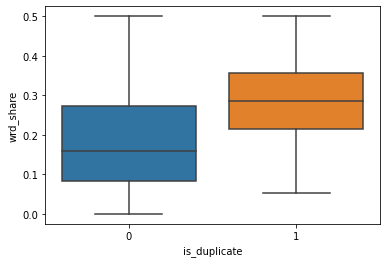

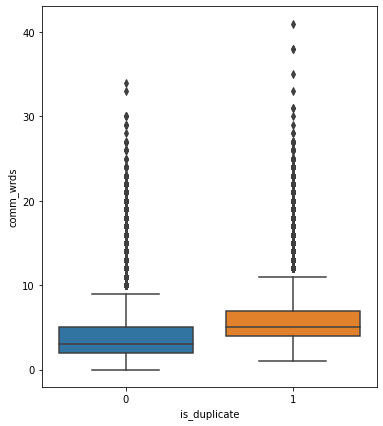

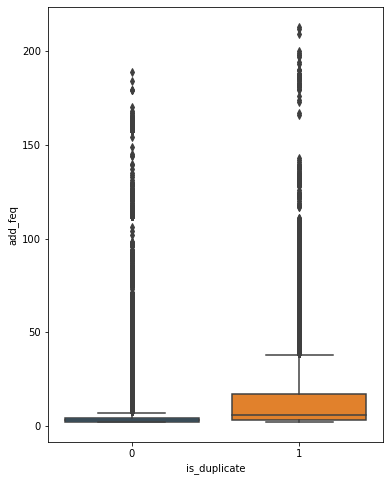

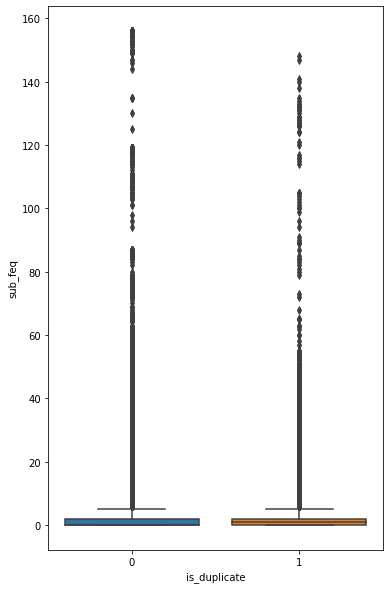

In [69]:
sns.boxplot(data = dataa,y='wrd_share',x='is_duplicate')
plt.figure(figsize=(6,7))
sns.boxplot(data = dataa,y='comm_wrds',x='is_duplicate')
plt.figure(figsize=(6,8))
sns.boxplot(data = dataa,y='add_feq',x='is_duplicate')
plt.figure(figsize=(6,10))
sns.boxplot(data = dataa,y='sub_feq',x='is_duplicate')

&lt;AxesSubplot:xlabel=&#39;wrd_share&#39;, ylabel=&#39;Count&#39;&gt;

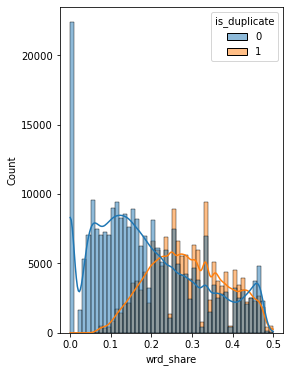

In [76]:
plt.figure(figsize=(4,6))
sns.histplot(x=dataa['wrd_share'],hue=dataa['is_duplicate'],bins=50,kde=True)

&lt;AxesSubplot:xlabel=&#39;comm_wrds&#39;, ylabel=&#39;Count&#39;&gt;

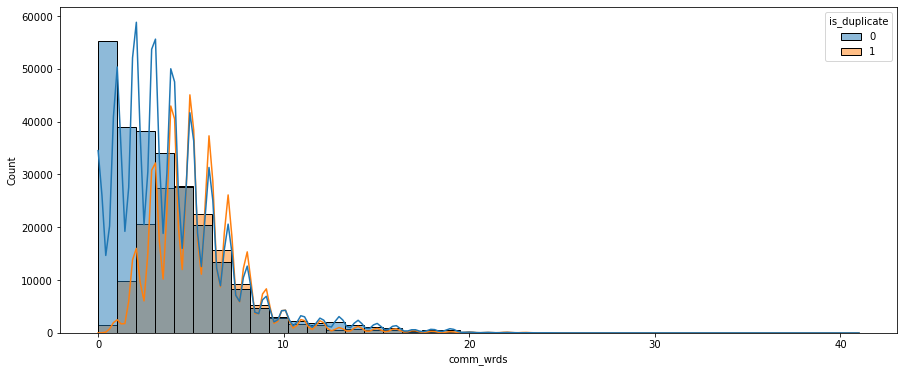

In [71]:
plt.figure(figsize=(15,6))
sns.histplot(x=dataa['comm_wrds'],hue=dataa['is_duplicate'],bins=40,kde=True)

> - ## Text Preprocessing

- Preprocessing:
    - Removing html tags 
    - Removing Punctuations
    - Performing stemming
    - Removing Stopwords
    - Expanding contractions etc.

In [111]:
SAFE_DIV = 0.0001 
STOP_WORDS = stopwords.words("english")

def preprocess(x):
    x = str(x).lower()
    ''' All these can only be recgonised when you traverse through the data set '''
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    porter = PorterStemmer()
    pattern = re.compile('\W')
    
    if type(x) == type(''): # Checking if the type == str  
        x = re.sub(pattern, ' ', x) # removes the punctuations
    
    if type(x) == type(''):  # Checking if the type == str
        x = porter.stem(x)
        example1 = BeautifulSoup(x)  
        ''' Here Beautiful soup's get_text() converts HTML content to normal string eg. <p>dude plzz concentrate</p> =>> 'dude plzz concentrate'  '''
        x = example1.get_text()
    return x
dataa['q1'] = dataa['question1'].fillna("").apply(preprocess)
dataa['q2'] = dataa['question2'].fillna("").apply(preprocess)

In [112]:
dataa.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_feq,q2_feq,q1_len,q2_len,q1_wrdcnt,q2_wrdcnt,comm_wrds,tot_wrtcnt,wrd_share,add_feq,sub_feq,q1,q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,12,11,10,23,0.434783,2,0,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,2,51,88,8,12,4,20,0.200000,6,2,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4,24,0.166667,2,0,how can i increase the speed of my internet co...,how can internet speed be increased by hacking...
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,10,9,0,19,0.000000,2,0,why am i mentally very lonely how can i solve...,find the remainder when math 23 24 math i...
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2,20,0.100000,4,2,which one dissolve in water quikly sugar salt...,which fish would survive in salt water


> ### Advance Featurization

In [213]:

def adv_fet(q1,q2,d):
    global pos_wrd_lst,neg_wrd_lst
    tokensq1 = q1.split()
    tokensq2 = q2.split()
    if(d==1):
        pos_wrd_lst.extend(tokensq1)
        pos_wrd_lst.extend(tokensq2)
    else:
        neg_wrd_lst.extend(tokensq1)
        neg_wrd_lst.extend(tokensq2)
    wordsq1 = set([w for w in tokensq1 if w not in STOP_WORDS])
    wordsq2 = set([w for w in tokensq2 if w not in STOP_WORDS])
    stopq1 = set([w for w in tokensq1 if w in STOP_WORDS])
    stopq2 = set([w for w in tokensq2 if w in STOP_WORDS])
    fet={}
    fet[0] = len(set(tokensq1).intersection(set(tokensq2)))/(min(len(set(tokensq1)),len(set(tokensq2)))+ SAFE_DIV) 
    fet[1] = len(set(tokensq1).intersection(set(tokensq2)))/(max(len(set(tokensq1)),len(set(tokensq2)))+ SAFE_DIV) 
    fet[2] = len(wordsq1.intersection(wordsq2))/(min(len(wordsq1),len(wordsq2)) + SAFE_DIV)
    fet[3] = len(wordsq1.intersection(wordsq2))/(max(len(wordsq1),len(wordsq2)) + SAFE_DIV)
    fet[4] = len(stopq1.intersection(stopq2))/(min(len(stopq1),len(stopq2)) + SAFE_DIV)
    fet[5] = len(stopq1.intersection(stopq2))/(max(len(stopq1),len(stopq2)) + SAFE_DIV)
    fet[6] = int(tokensq1[0] == tokensq2[0])
    fet[7] = int(tokensq1[-1] == tokensq2[-1])
    fet[8] = abs(len(tokensq1)-len(tokensq2))
    fet[9] = (len(tokensq1) + len(tokensq2))/2
    '''fuzz.QRatio, fuzz.UQRatio are
    Just wrappers around fuzz.ratio with some validation and short-circuiting, included here for completeness. UQRatio is a unicode version of QRatio.'''
    fet[10] = fuzz.QRatio(q1,q2)
    fet[11] = fuzz.partial_ratio(q1,q2)
    fet[12] = fuzz.token_sort_ratio(q1,q2)
    fet[13] = fuzz.token_set_ratio(q1,q2)
    lss = list(distance.lcsubstrings(q1,q2))
    fet[14] = (len(lss[0]) / (min(len(q1), len(q2)) + 1)) if len(lss) != 0 else 0
    return [items for key,items in fet.items()]

In [214]:
feat=[]
pos_wrd_lst=[]
neg_wrd_lst=[]
for index,row in tqdm(dataa.iterrows()):
     feat.append(adv_fet(row['q1'],row['q2'],row['is_duplicate']))
    #  print(row['q1'],row['q2'])
feat = pd.DataFrame(feat)
pos_str = ' '.join([str(elem) for elem in pos_wrd_lst])
neg_str = ' '.join([str(elem) for elem in neg_wrd_lst])

3306it [00:11, 297.67it/s]


IndexError: list index out of range

In [ ]:
feat

<h3> Analysis of extracted features </h3>

In [ ]:
stopwords = set(STOPWORDS)
wc = WordCloud(background_color="white", stopwords=stopwords)
wc.generate(pos_str)
print ("Word Cloud for Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
stopwords = set(STOPWORDS)
wc = WordCloud(background_color="white", stopwords=stopwords)
wc.generate(neg_str)
print ("Word Cloud for Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()